In [1]:
import earthaccess
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [2]:
auth = earthaccess.login(persist=True)

In [3]:
tspan = ("2024-04-01", "2025-05-31")
results_moana = earthaccess.search_data(
    short_name="PACE_OCI_L3M_MOANA",
    granule_name="*.DAY.*0p1deg*",  # Daily only for MOANA | Resolution: 0p1deg or 4 (for 4km)
    temporal=tspan,
    # cloud=(0, 50)
)

In [4]:
print(len(results_moana))
path_moana    = earthaccess.open(results_moana)
dataset_moana = xr.open_mfdataset(path_moana, combine="nested", concat_dim="date")
dataset_moana

376


QUEUEING TASKS | :   0%|          | 0/376 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/376 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/376 [00:00<?, ?it/s]

<xarray.Dataset> Size: 7GB
Dimensions:          (date: 376, lat: 1400, lon: 1100, rgb: 3,
                      eightbitcolor: 256)
Coordinates:
  * lat              (lat) float32 6kB 69.95 69.85 69.75 ... -69.85 -69.95
  * lon              (lon) float32 4kB -84.95 -84.85 -84.75 ... 24.85 24.95
Dimensions without coordinates: date, rgb, eightbitcolor
Data variables:
    prococcus_moana  (date, lat, lon) float32 2GB dask.array<chunksize=(1, 512, 1024), meta=np.ndarray>
    syncoccus_moana  (date, lat, lon) float32 2GB dask.array<chunksize=(1, 512, 1024), meta=np.ndarray>
    picoeuk_moana    (date, lat, lon) float32 2GB dask.array<chunksize=(1, 512, 1024), meta=np.ndarray>
    palette          (date, rgb, eightbitcolor) uint8 289kB dask.array<chunksize=(1, 3, 256), meta=np.ndarray>
Attributes: (12/62)
    product_name:                      PACE_OCI.20240401.L3m.DAY.MOANA.V3_0.0...
    instrument:                        OCI
    title:                             OCI Level-3 Standard Mapped Image
    project:                           Ocean Biology Processing Group (NASA/G...
    platform:                          PACE
    source:                            satellite observations from OCI-PACE
    ...                                ...
    cdm_data_type:                     grid
    identifier_product_doi_authority:  http://dx.doi.org
    identifier_product_doi:            10.5067/PACE/OCI/L3M/MOANA/3.0
    data_bins:                         166600
    data_minimum:                      -inf
    data_maximum:                      inf

### <b>Check availability</b>

In [5]:
lon = dataset_moana.lon
lat = dataset_moana.lat

In [6]:
# def qc_check(da):
#     # check data availability
#     flag_min = da.attrs["valid_min"]
#     flag_max = da.attrs["valid_max"]
#     flag_    = ( da >= flag_min ) & ( da <= flag_max)
    
#     px_      = flag_.sum(dim="date")
#     return px_, flag_min, flag_max

In [7]:
# # check data availability
# px_pro, _, _  = qc_check(dataset_moana["prococcus_moana"])
# px_syn, _, _  = qc_check(dataset_moana["syncoccus_moana"])
# px_pico, _, _ = qc_check(dataset_moana["picoeuk_moana"])


In [8]:
# fig, ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(10, 6))
# vmin = 0
# vmax = len(results_moana)
# cax1 = ax[0].pcolormesh(lon, lat, px_pro, vmin=vmin, vmax=vmax, cmap="Blues")
# cax2 = ax[1].pcolormesh(lon, lat, px_syn, vmin=vmin, vmax=vmax, cmap="Blues")
# cax3 = ax[2].pcolormesh(lon, lat, px_pico, vmin=vmin, vmax=vmax, cmap="Blues")
# plt.colorbar(cax1, ax=ax[2], label="# of days available")
# fig.suptitle("Data availability of MOANA (pro/syn/pico on left/middle/right)")

In [6]:
# label by month
date0 = np.datetime64(tspan[0]) # np.datetime64("2024-03-05")
time_delta_days = np.arange(len(results_moana))
time_delta = time_delta_days.astype('timedelta64[D]')
dates = date0 + time_delta
month = dates.astype('datetime64[M]')# .astype(int) % 12 + 1


In [ ]:
# # check data availability by month
# flag_min = da.attrs["valid_min"]
# flag_max = da.attrs["valid_max"]
# flag_    = ( da >= flag_min ) & ( da <= flag_max)

### <b>Monthly Mean of each group</b>

In [11]:
# group by month
dataset_moana["date"] = dates
dataset_moana["month"] = month
mean_by_month_pro = dataset_moana.prococcus_moana.groupby('date.month').mean()
mean_by_month_syn = dataset_moana.syncoccus_moana.groupby('date.month').mean()
mean_by_month_pico = dataset_moana.picoeuk_moana.groupby('date.month').mean()

/srv/conda/envs/notebook/lib/python3.11/site-packages/numpy/_core/_methods.py:52: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Text(0.5, 0.98, 'prococcus')

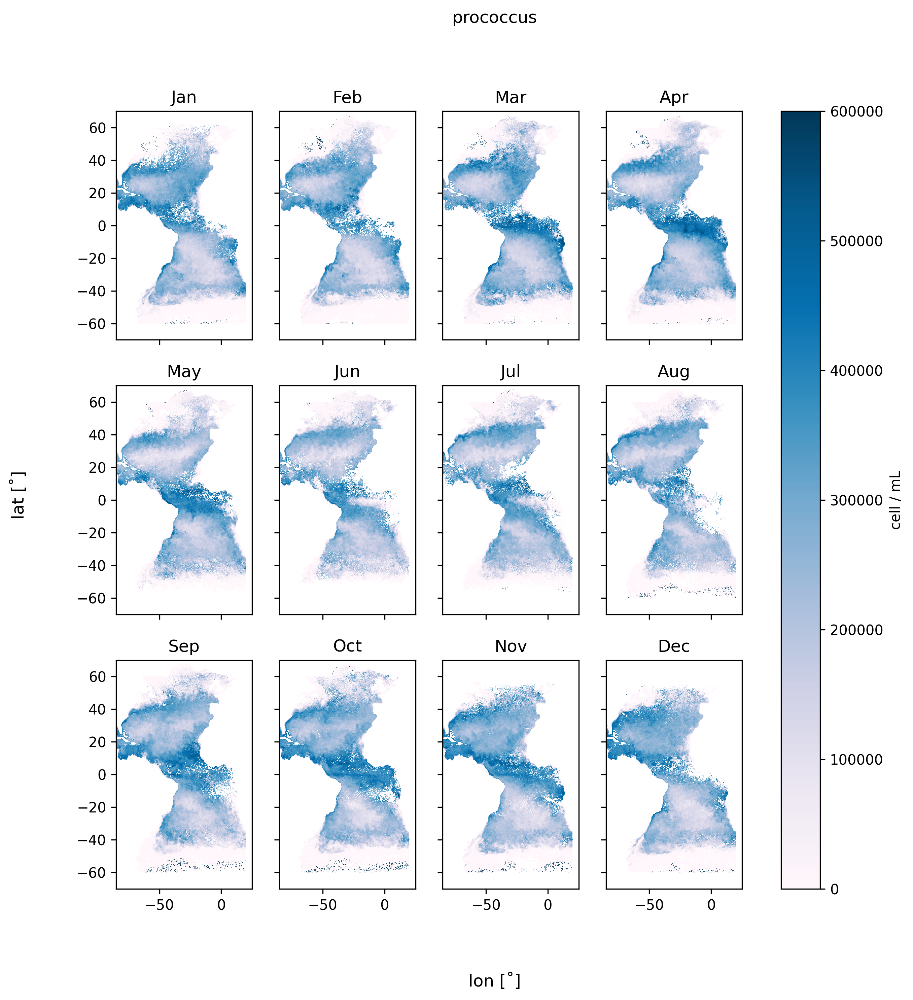

In [19]:
# visualize
vmin = dataset_moana.prococcus_moana.attrs["valid_min"]
vmax = dataset_moana.prococcus_moana.attrs["valid_max"]
mat  = mean_by_month_pro
cmap = "PuBu"
month_name = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
fig, axes = plt.subplots(3, 4, figsize=(10,10), sharex=True, sharey=True, dpi=300)
ax = axes.flatten()
for i in range(1, 13):
    last_im = ax[i-1].pcolormesh(lon, lat, mat.sel(month=i), vmin=vmin, vmax=vmax, cmap=cmap)
    ax[i-1].set_title(month_name[i-1])

fig.colorbar(last_im, ax=axes.ravel().tolist(), label='cell / mL')
fig.supxlabel("lon [˚]")
fig.supylabel("lat [˚]")
fig.suptitle("prococcus")

Text(0.5, 0.98, 'syncoccus')

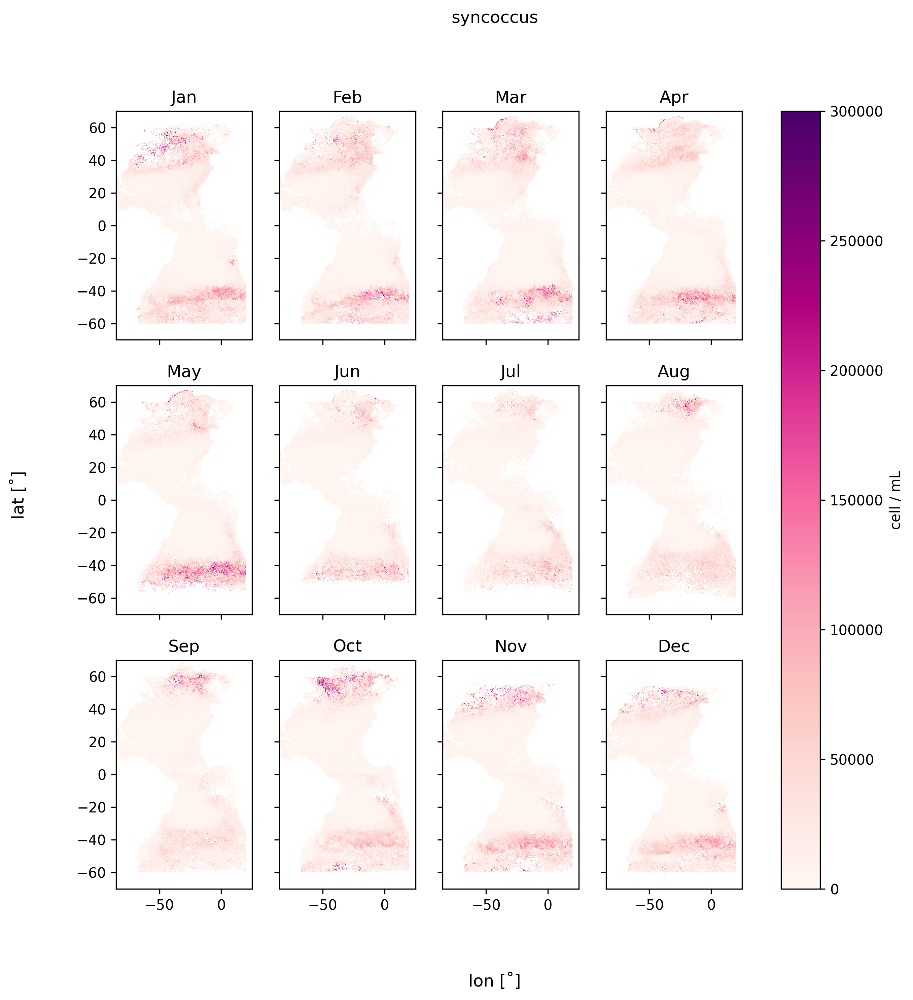

In [20]:
# visualize
vmin = dataset_moana.syncoccus_moana.attrs["valid_min"]
vmax = dataset_moana.syncoccus_moana.attrs["valid_max"]
mat  = mean_by_month_syn
cmap = "RdPu"
month_name = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
fig, axes = plt.subplots(3, 4, figsize=(10,10), sharex=True, sharey=True, dpi=300)
ax = axes.flatten()
for i in range(1, 13):
    last_im = ax[i-1].pcolormesh(lon, lat, mat.sel(month=i), vmin=vmin, vmax=vmax, cmap=cmap)
    ax[i-1].set_title(month_name[i-1])

fig.colorbar(last_im, ax=axes.ravel().tolist(), label='cell / mL')
fig.supxlabel("lon [˚]")
fig.supylabel("lat [˚]")
fig.suptitle("syncoccus")

Text(0.5, 0.98, 'picoeuk')

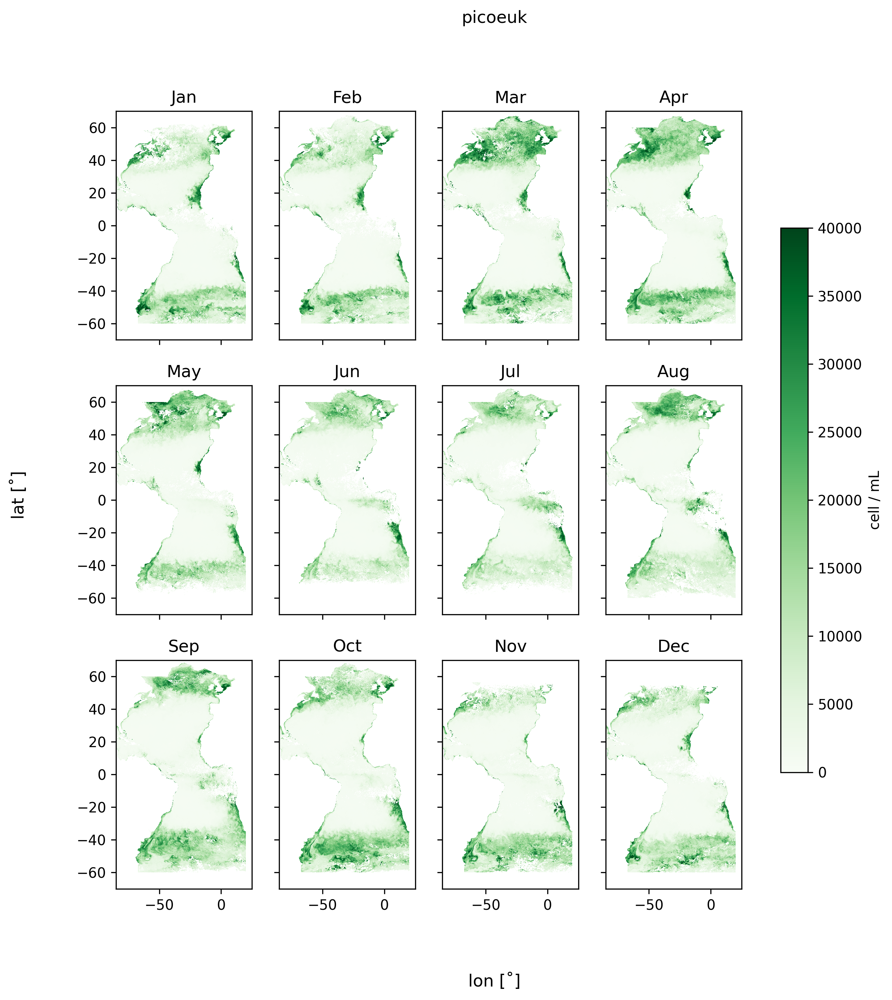

In [13]:
# visualize
vmin = dataset_moana.picoeuk_moana.attrs["valid_min"]
vmax = dataset_moana.picoeuk_moana.attrs["valid_max"]
mat  = mean_by_month_pico
cmap = "Greens"
month_name = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
fig, axes = plt.subplots(3, 4, figsize=(10,10), sharex=True, sharey=True, dpi=300)
ax = axes.flatten()
for i in range(1, 13):
    last_im = ax[i-1].pcolormesh(lon, lat, mat.sel(month=i), vmin=vmin, vmax=vmax, cmap=cmap)
    ax[i-1].set_title(month_name[i-1])

fig.colorbar(last_im, ax=axes.ravel().tolist(), label='cell / mL', shrink=.7)
fig.supxlabel("lon [˚]")
fig.supylabel("lat [˚]")
fig.suptitle("picoeuk")